Import fastbooka - pierwszy raz będę z niego korzystał.

In [2]:
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

import os


### Pobranie i zaprezentowanie źródłowych datasetów oraz krótkie omówienie planu na przygotowanie danych
#### Plan
 ##### Planuję skupić się na dobrym dataset, tzn. poniżej będę łączył ze sobą 2 duże datasety oraz z pomocą własnego projektu będę tagował te zdjęcia i robił selekcje najlepszych do mojego docelowego dataset. Projekt o którym wspomniałem to "Taggy" - https://github.com/4ieksander/taggyAI który był zaczęty na potrzeby przedmiotu z poprzedniego semestru, lecz mam zamiar go nadal prywatnie rozwijać.
Na potrzeby tego projektu rozszerzyłem jego funkcjonalność o komendę "class_selection".

Poniżej pobieram dataset z kaggle "shaunthesheep/microsoft-catsvsdogs-dataset" zawierający 25000 grafik.

In [3]:
import kagglehub
import os
import shutil

ms_target_folder = "D:/code/animal-color-classification/microsoft"

In [76]:
downloaded_path = kagglehub.dataset_download("shaunthesheep/microsoft-catsvsdogs-dataset")
destination_path = os.path.join(ms_target_folder, os.path.basename(downloaded_path))

os.makedirs(ms_target_folder, exist_ok=True)
shutil.move(downloaded_path, destination_path)
print("Pliki zostały zapisane w:", destination_path)

Pliki zostały zapisane w: D:/code/animal-color-classification/microsoft\1


Jest to zestaw grafik podzielonych na 2 klasy, koty i psy, obie klasy posiadają po 12500 zdjęć, łącznie jest ich 25000.
Postanowiłem przygotować sobie z tych grafik swój własny dataset z większą ilością klas.
Zrobiłem to poprzez rozwinięcie mojego projektu z zeszłego projektu "Taggy" służącego dotychczas do tagowania/wyszukiwania/wykrywania duplikatów, rozwinąłem go o komendę "class_selection".

In [4]:
def show_random_images_with_parent_label_and_basic_info(path_to_images, max_n=10, nrows=2):
    path = Path(path_to_images)
    loko = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items=get_image_files,
        splitter=RandomSplitter(valid_pct=0.2, seed=42),
        get_y=parent_label, # tzn. podfoldery to są nazwy klasy.
        item_tfms=Resize(128))
    dls = loko.dataloaders(path)
    print(f"Klasy: {dls.vocab}")
    for i in os.listdir(path_to_images):
        try:
            path = os.path.join(path_to_images, i)
            print(f"Liczba elementów dla klasy {i}: {len(os.listdir(path))}")
        except:
            pass
    dls.valid.show_batch(max_n=max_n, nrows=nrows)

Klasy: ['Cat', 'Dog']
Liczba elementów dla klasy Cat: 12501
Liczba elementów dla klasy Dog: 12501


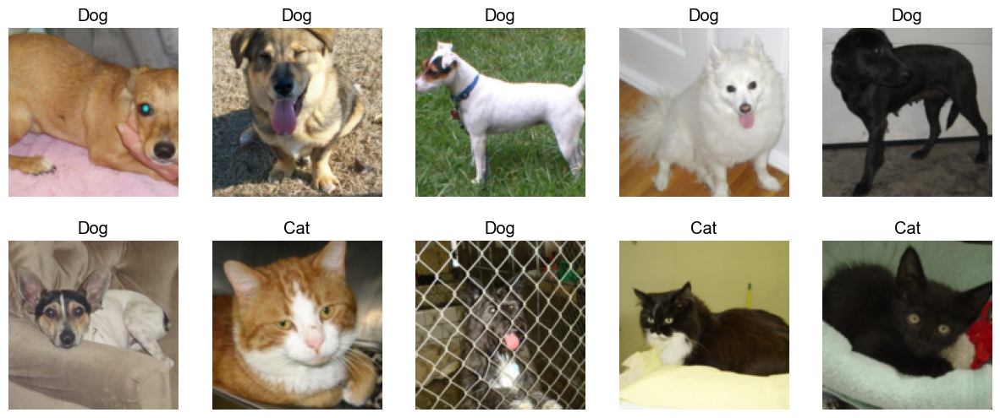

In [5]:
ms_images_path = f'{ms_target_folder}/1/PetImages'
show_random_images_with_parent_label_and_basic_info(ms_images_path)

Dodatkowo pobieram jeszcze jeden dataset, również zawierający jedynie 2 klasy, zawierający po 5000 tysięcy grafik na klasę.

In [6]:
target_folder = "D:/code/animal-color-classification/no_microsoft"

In [73]:
path = kagglehub.dataset_download("d4rklucif3r/cat-and-dogs")

os.makedirs(target_folder, exist_ok=True)
destination_path = os.path.join(target_folder, os.path.basename(path))
shutil.move(path, destination_path)
print("Pliki zostały zapisane w:", destination_path)

100%|██████████| 218M/218M [00:12<00:00, 17.7MB/s] 

Extracting files...


Pliki zostały zapisane w: D:/code/animal-color-classification/no_microsoft\1


Klasy: ['cats', 'dogs', 'single_prediction']
Liczba elementów dla klasy single_prediction: 2
Liczba elementów dla klasy test_set: 2
Liczba elementów dla klasy training_set: 2


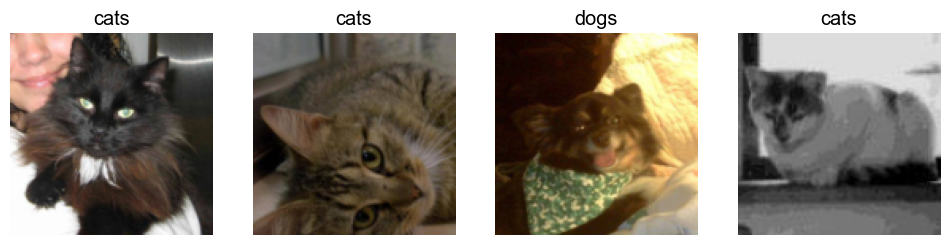

In [7]:
no_ms_images_path = f'{target_folder}/1/dataset'
show_random_images_with_parent_label_and_basic_info(no_ms_images_path, max_n=4, nrows=1)

Klasy: ['cats', 'dogs']
Liczba elementów dla klasy cats: 1000
Liczba elementów dla klasy dogs: 1000


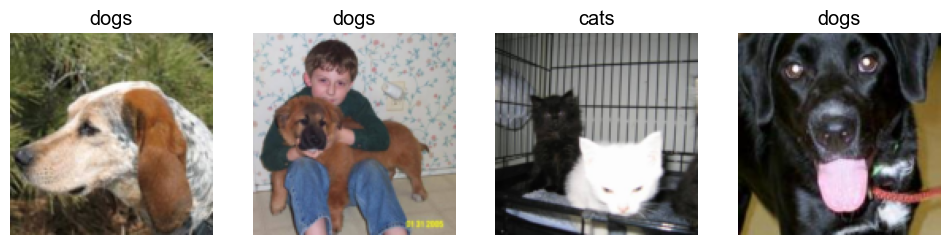

In [8]:
show_random_images_with_parent_label_and_basic_info(os.path.join(no_ms_images_path, "test_set"), max_n=4, nrows=1)

Klasy: ['cats', 'dogs']
Liczba elementów dla klasy cats: 4000
Liczba elementów dla klasy dogs: 4000


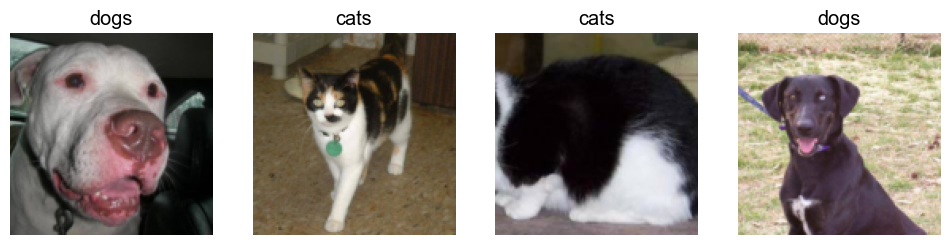

In [77]:
show_random_images_with_parent_label_and_basic_info(os.path.join(no_ms_images_path, "training_set"), max_n=4, nrows=1)

Jako że będę łączył 2 datasety, to chcę połączyć obie klasy z obu źródeł, aby z jednego zbioru robić selekcję grafik najbardziej się nadających do klasyfikacji, z tego powodu też likwiduję początkowy podział na TRAIN/VAL/TEST tego datasetu.

In [21]:
dst_folder = "D:/code/animal-color-classification/data"

In [83]:
import shutil
train_dir = f"{no_ms_images_path}/training_set"
test_dir = os.path.join(no_ms_images_path, "test_set")
single = os.path.join(no_ms_images_path, "single_prediction")
shutil.copytree(train_dir, dst_folder, dirs_exist_ok=True)
shutil.copytree(test_dir, dst_folder, dirs_exist_ok=True)
shutil.copytree(single, dst_folder, dirs_exist_ok=True)
shutil.copytree(ms_images_path, dst_folder, dirs_exist_ok=True)

'D:/code/animal-color-classification/data'

In [84]:
print(os.listdir(dst_folder))

['Cat', 'cats', 'cat_or_dog_1.jpg', 'cat_or_dog_2.jpg', 'Dog', 'dogs']


In [85]:
shutil.move(os.path.join(dst_folder, "cats"), os.path.join(dst_folder, "Cat"))
shutil.move(os.path.join(dst_folder, "dogs"), os.path.join(dst_folder, "Dog"))

'D:/code/animal-color-classification/data\\Dog\\dogs'

In [86]:
print(os.listdir(dst_folder))

['Cat', 'cat_or_dog_1.jpg', 'cat_or_dog_2.jpg', 'Dog']


In [89]:
print(len(os.listdir(os.path.join(dst_folder, "Cat"))))

12502


### :)

In [91]:
cats_sub_dir= os.path.join(dst_folder, "Cat", "cats")
dogs_sub_dir = os.path.join(dst_folder, "Dog", "dogs")

for file in os.listdir(cats_sub_dir):
    shutil.move(os.path.join(cats_sub_dir, file), os.path.join(dst_folder, "Cat"))
for file in os.listdir(dogs_sub_dir):
    shutil.move(os.path.join(dogs_sub_dir, file), os.path.join(dst_folder, "Dog"))

In [93]:
print(len(os.listdir(os.path.join(dst_folder, "Cat"))))
print(len(os.listdir(os.path.join(dst_folder, "Dog"))))

17502
17502


In [95]:
os.removedirs(cats_sub_dir)
os.removedirs(dogs_sub_dir)

Klasy: ['Cat', 'Dog', 'data']
Liczba elementów dla klasy Cat: 17501
Liczba elementów dla klasy Dog: 17501


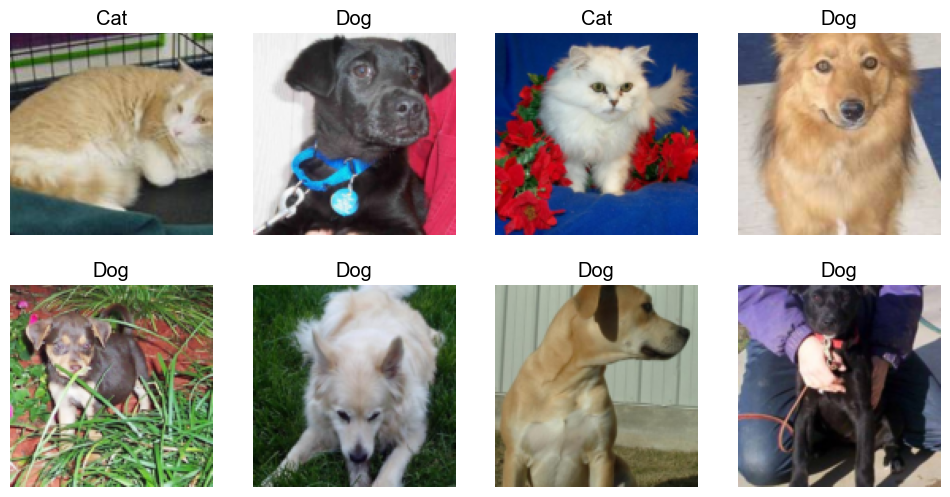

In [100]:
show_random_images_with_parent_label_and_basic_info(dst_folder, max_n=8, nrows=2)


# Taggy - projekt własny wykorzystany na potrzeby przygotowania datasetu

#### Taggy to projekt operujący na plikach graficznych. Dotychczas posiadał zaimplementowane 3 główne komendy,
- "duplicates": wykrywanie duplikatów, grupowanie po wskazanych labelkach, propozycje nalepszych grafik z duplikatów, zbieranie unikalnych grafik. Ładuje wszystkie pliki ze wskazanej ścieżki do ramu i na tej podstawie porównuje je względem podobieństwa kosinusowego
- "tag": przypisywanie tagów (labelek) do grafik, threshold jest wyznaczany na podsatwie wszystkich pozostałych przekazanych szukanych oznaczeń. Każdy plik ma przypisywane tagi niezależnie od innych plików, analizuje po jednym pliku jednocześnie - próbowałem uruchomić to wielowątkowo, ale zdecydowanie narzędzie zwolniło.
- "search": na podstawie szukanej frazy szuka najbardziej pasujące grafiki do zapytania. Również najpierw wszystko ładuje ze wskazanej ścieżki do pamięci RAM, a dopiero później analizuje dane.
- "<b>class_selection</b>": ta komenda została zaimplementowana właśnie na potrzeby tego projektu.
##### Projekt mam dalszych planach rozwijać, posiada on w sobie również dokumentację wygenerowaną poprzez kilka silników oraz zaimplementowałem tam automatyczne tłumaczenie całej dokumentacji poprzez API DeepL. Pełny projekt jest dostępny pod linkiem:  https://github.com/4ieksander/taggyAI

## TAGGY: logger

In [9]:
import logging

class CustomFormatter(logging.Formatter):
    """
    Custom logging formatter to add colors to log messages based on their severity level.
    """
    RESET = "\033[0m"
    COLORS = {
        logging.DEBUG: "\033[94m",  # Blue
        logging.INFO: "\033[92m",   # Green
        logging.WARNING: "\033[93m",  # Yellow
        logging.ERROR: "\033[91m",  # Red
        logging.CRITICAL: "\033[95m",  # Magenta
    }

    def format(self, record):
        """
        Format the specified record as text.

        Args:
            record (logging.LogRecord): The log record to be formatted.

        Returns:
            str: The formatted log message with color.
        """
        log_color = self.COLORS.get(record.levelno, self.RESET)
        return f"{log_color}{super().format(record)}{self.RESET}"

# Create a console handler with a custom formatter
console_handler = logging.StreamHandler()
console_handler.setLevel(logging.INFO)
console_handler.setFormatter(CustomFormatter("%(asctime)s - %(levelname)s - %(message)s"))

# Create a file handler to log messages to a file
file_handler = logging.FileHandler("../logs_taggy.log")
file_handler.setLevel(logging.DEBUG)
file_handler.setFormatter(logging.Formatter("%(asctime)s - %(levelname)s - %(message)s"))

# Configure the root logger with the console and file handlers
logging.basicConfig(
    level=logging.DEBUG,
    handlers=[console_handler, file_handler],
)

def show_example_logs():
    """
    Generate example log messages of various severity levels.
    """
    logging.debug("This is a debug log.")
    logging.info("This is an informational log.")
    logging.warning("This is a warning log.")
    logging.error("This is an error log.")
    logging.critical("This is a critical log.")

def get_logger(name):
    """
    Get a logger with the specified name.

    Args:
        name (str): The name of the logger.

    Returns:
        logging.Logger: The logger instance.
    """
    return logging.getLogger(name)
show_example_logs()

2025-03-15 21:53:16,532 - INFO - This is an informational log.
2025-03-15 21:53:16,532 - WARNING - This is a warning log.
2025-03-15 21:53:16,532 - ERROR - This is an error log.
2025-03-15 21:53:16,532 - CRITICAL - This is a critical log.


Import wszystkich bibliotek używanych w Taggy

In [10]:
import os
import click
import torch
import clip
import numpy as np
from PIL import Image

try:
    import cv2
except ImportError:
    cv2 = None
import shutil
from typing import List

import win32com.client
import json
import configparser

from click import pass_context

In [11]:
logger = get_logger("TAGGY")

## TAGGY: moduł file_utils

In [45]:
def load_config(config_file: str = "config.ini"):
    """
    Loads default values from an INI config file and returns them as a dictionary-like object.

    Args:
        config_file (str, optional): The path to the config file. Defaults to "config.ini".

    Returns:
        configparser.SectionProxy: A config section (dict-like) with default values.
    """
    config = configparser.ConfigParser()
    if os.path.exists(config_file):
        config.read(config_file, encoding='utf-8')
        logger.info(f"Loaded config file: {config_file}")
    elif os.path.exists("taggy_config/config.ini"):
        config_file = "taggy_config/config.ini"
        config.read(config_file, encoding='utf-8')
        logger.info(f"Loaded default config file: {config_file}")
    else:
        logger.warning(f"Config file '{config_file}' does not exist. Using default in-code values.")
        config["DEFAULT"] = {
            "input_dataset_path": "./images",
            "labels": "people, documents, gadgets, cables, festivals, work, pets, random, nature, food, travel, architecture, art",
            "operation": "copy",
            "threshold": "0.3",
            "metadata_output": "metadata.json"
        }
        logger.debug("Default config values:")
        for key, value in config["DEFAULT"].items():
            logger.debug(f"{key}: {value}")

    return config["DEFAULT"]

def create_directory(path):
    """
    Creates a directory if it does not exist.

    Args:
        path (str): Path to the directory.
    """
    if not os.path.exists(path):
        os.makedirs(path)
        logger.debug(f"Created directory: {path}")

def copy_file(src, dest):
    """
    Copies a file from src to dest, preserving metadata (timestamps, etc.).

    Args:
        src (str): Source file path.
        dest (str): Destination file path.
    """
    shutil.copy2(src, dest)

def create_shortcut(target, shortcut_path, description=None, icon_path=None):
    """
    Creates a Windows shortcut (.lnk) to the target file.

    Args:
        target (str): Absolute path to the target file.
        shortcut_path (str): Absolute path where the shortcut will be created.
        description (str, optional): Shortcut description. Defaults to None.
        icon_path (str, optional): Path to an icon file. Defaults to None.
    """
    target = os.path.abspath(target)
    shortcut_path = os.path.abspath(shortcut_path)
    shell = win32com.client.Dispatch("WScript.Shell")
    shortcut = shell.CreateShortcut(shortcut_path)
    shortcut.TargetPath = target
    shortcut.WorkingDirectory = os.path.dirname(target)
    if description:
        shortcut.Description = description
    if icon_path and os.path.exists(icon_path):
        shortcut.IconLocation = icon_path
    shortcut.save()

def perform_file_operation(src, dest_dir, operation, description=None, icon_path=None, filename=None):
    """
    Performs a file operation (copy or symlink/shortcut) from src to dest_dir.

    Args:
        src (str): Source file path.
        dest_dir (str): Destination directory path.
        operation (str): Type of operation ('copy', 'symlink', etc.).
        description (str, optional): Used if creating a shortcut. Defaults to None.
        icon_path (str, optional): Used if creating a shortcut. Defaults to None.
    """
    dest = os.path.join(dest_dir, os.path.basename(src))
    create_directory(dest_dir)
    try:
        if operation == "copy":
            copy_file(src, dest)
        if operation == "move" :
            shutil.move(src, dest)
        if operation == "symlink":
            if os.name == "nt":
                # Windows shortcut
                create_shortcut(src, dest + ".lnk", description, icon_path)
            else:
                # Unix symlink
                os.symlink(src, dest)
        if filename:
            os.rename(dest, os.path.join(dest_dir, filename))
    except Exception as e:
        logger.error(e)
def save_metadata_to_json(metadata, output_file):
    """
    Saves metadata to a JSON file.

    Args:
        metadata (dict or list): Metadata to be saved.
        output_file (str): Path to the output JSON file.
    """
    with open(output_file, 'w', encoding='utf-8') as json_file:
        json.dump(metadata, json_file, indent=4, ensure_ascii=False)
    logger.debug(f"Results saved to {output_file}")



def list_supported_image_files(images_path):
    """
    Returns a list of supported image file paths in the given directory.
    Supported extensions: png, jpg, jpeg, bmp, webp

    Args:
        images_path (str): Path to a folder containing images.

    Returns:
        List[str]: List of file paths found with supported extensions.
    """
    if not os.path.isdir(images_path):
        logger.warning(f"Directory does not exist: {images_path}")
        return []
    exts = ('.png', '.jpg', '.jpeg', '.bmp', '.webp')
    files = [
        os.path.join(images_path, f)
        for f in os.listdir(images_path)
        if f.lower().endswith(exts)
    ]
    return files


def preprocess_image(img_path, preprocess, device) -> torch.Tensor:
    """
    Opens and preprocesses a single image using the provided CLIP preprocess pipeline.

    Args:
        img_path (str): Path to the image file.
        preprocess (callable): The CLIP preprocess transform.
        device (str or torch.device): 'cpu' or 'cuda'.

    Returns:
        torch.Tensor: The preprocessed image on the appropriate device.z
    """
    pil_img = Image.open(img_path)
    img_tensor = preprocess(pil_img).unsqueeze(0).to(device)
    return img_tensor


## TAGGY: image_tagger

In [14]:
"""
Module that provides both synchronous functionality for:
    - Tagging images using CLIP
    - Searching for images by similarity to a text query
    - Finding and grouping duplicate images by embedding similarity
    - Proposing the best images in each group based on multiple metrics:
          - Naive "sharpness" via Laplacian
          - Face-detection-based sharpness
    - Optionally placing non-duplicates in a 'non_duplicates' folder
    - Saving grouping results to JSON
"""
class ImageTagger:
    """
    A class used to tag images, search for images by similarity, find and group duplicate images,
    and propose the best images in each group based on multiple metrics.

    Attributes:
        model_name (str): The name of the model to load.
        labels (list): List of possible tags.
        face_cascade_path (str): The path to the Haar cascade file for face detection.
        device (str): The device to run the model on (CPU or GPU).
        model (torch.nn.Module): The loaded CLIP model.
        preprocess (callable): The preprocessing function for the CLIP model.
    """

    def __init__(self,
                 model_name: str = "CLIP",
                 labels: list = None,
                 face_cascade_path: str = None):
        """
        Initializes the ImageTagger instance.

        Args:
            model_name (str): Name of the model to load. Defaults to "CLIP".
            labels (list, optional): List of possible tags. Defaults to None.
            face_cascade_path (str, optional): Path to the Haar cascade file for face detection. Defaults to None.
        """
        self.labels = labels
        self.model_name = model_name
        self.face_cascade_path = face_cascade_path

        if torch.cuda.is_available():
            logger.critical(f"CUDA available, device: {torch.cuda.get_device_name(0)}")
        else:
            logger.critical("CUDA not available, using CPU.")

        if model_name == "CLIP":
            self.device = "cuda" if torch.cuda.is_available() else "cpu"
            self.model, self.preprocess = clip.load("ViT-B/32", device=self.device)
            logger.info("CLIP model loaded successfully.")
        else:
            raise ValueError(f"Unsupported model: {model_name}")

        if cv2 is None:
            logger.warning("OpenCV not installed. Face-detection-based metrics may be unavailable.")



    # ---------------------------------------
    # Tagging images - command 'tag'
    # ---------------------------------------
    def tag_image(self,
                  image_path: str,
                  output_path: str = None,
                  top_k: int = 5,
                  labels=None,
                  threshold: float = 0.3,
                  operation: str = None,
                  output_folder: str = None):
        """
        Generates tags for a given image using CLIP, optionally saves metadata.

        Args:
            image_path (str): Path to the image.
            output_path (str, optional): Path to save metadata. Defaults to None.
            top_k (int, optional): Number of top tags to return. Defaults to 5.
            labels (list) List of possible tags.
            threshold (float, optional): Probability threshold. Defaults to 0.3.

        Returns:
            list[dict]: A list of assigned tags (tag + probability).
        """
        results = self._process_image(image_path, threshold,  labels)
        results = sorted(results, key=lambda x: x["probability"], reverse=True)[:top_k]

        if output_folder and results:
            assigned_labels = [r["tag"] for r in results]
            for label in assigned_labels:
                label_dir = os.path.join(output_folder, label)
                create_directory(label_dir)
                perform_file_operation(image_path, label_dir, operation)

        if output_path and results:
            metadata = {"file": image_path, "tags": results}
            save_metadata_to_json(metadata, output_path)
        return results


    # ---------------------------------------
    # Search  image(s) similarity to query - command 'search'
    # ---------------------------------------
    def search_images(self, query: str, images_path: str, top_k: int = 5, output_path: str = None, operation: str = None):
        """
        Searches for images similar to a text query using the CLIP model.

        Args:
            query (str): The text query to search for.
            images_path (str): Path to the directory containing images.
            top_k (int, optional): Number of top similar images to return. Defaults to 5.
            output_path (str, optional): Path to save files what was found. Defaults to None.
            operation (str, optional): File operation. Defaults to "copy".

        Returns:
            list[tuple[str, float]]: A list of tuples containing image file paths and their similarity scores.
        """
        image_files, image_tensors = self._load_images(images_path)
        if len(image_files) == 0 or image_tensors.shape[0] == 0:
            logger.warning("No images to search in (sync).")
            return []
        logger.info(f"Searching for '{query}' in {len(image_files)} images ...")
        with torch.no_grad():
            image_features = self.model.encode_image(image_tensors).float()
        text_inputs = clip.tokenize([query]).to(self.device)
        with torch.no_grad():
            text_features = self.model.encode_text(text_inputs).float()

        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        similarities = (text_features @ image_features.T).squeeze(0).cpu().numpy()
        sorted_indices = np.argsort(similarities)[::-1][:top_k]
        results = [(image_files[idx], float(similarities[idx])) for idx in sorted_indices]
        if output_path and results:
            for img_path, score in results:
                if top_k > 10:
                    filename = f"{score:.4f}_{os.path.basename(img_path)}"
                else:
                    filename = os.path.basename(img_path)
                perform_file_operation(img_path, output_path, operation, filename=filename)
            logger.info(f"Files saved to {output_path} with operation: {operation}")
        return results


    # ---------------------------------------
    # Find duplicates - command 'duplicates'
    # ---------------------------------------
    def find_duplicates(self, images_path: str, similarity_threshold: float = 0.9):
        """
        Identifies duplicate images by cosine similarity of embeddings, synchronously.

        This method loads images from the specified directory, computes their embeddings using the CLIP model,
        and then calculates the cosine similarity between each pair of images. If the similarity exceeds the
        specified threshold, the pair is considered a duplicate.

        Args:
            images_path (str): Path to the folder containing images.
            similarity_threshold (float): Threshold for considering images as duplicates, ranging from 0 to 1. Defaults to 0.9.

        Returns:
            list[tuple[str, str, float]]: A list of tuples where each tuple contains two image paths and their similarity score.
        """
        logger.info("Checking duplicates (sync) ...")
        image_files, image_tensors = self._load_images(images_path)
        if len(image_files) == 0 or image_tensors.shape[0] == 0:
            logger.warning("No images found for duplicate checking (sync).")
            return []

        logger.info(f"Loaded {len(image_files)} images for duplicate checking.")
        with torch.no_grad():
            image_features = self.model.encode_image(image_tensors).float()

        logger.info("Image features extracted.")
        image_features /= image_features.norm(dim=-1, keepdim=True)

        similarity_matrix = image_features @ image_features.T
        logger.info("Similarity matrix computed.")

        duplicates = []
        num_images = len(image_files)
        total_pairs = (num_images * (num_images - 1)) // 2
        logger.info(f"Comparing {total_pairs} pairs of images ...")

        pair_gen = ((i, j) for i in range(num_images) for j in range(i + 1, num_images))
        logger.info("Starting comparison ...")

        with click.progressbar(pair_gen, label="Comparing pairs", length=total_pairs) as bar:
            for (i, j) in bar:
                similarity = float(similarity_matrix[i, j].item())
                if similarity >= similarity_threshold:
                    duplicates.append((image_files[i], image_files[j], similarity))

        return duplicates


    # ---------------------------------------
    # Group duplicates - command 'duplicates'
    # ---------------------------------------
    def group_duplicates(self,
                         duplicates: list,
                         output_folder: str,
                         operation: str = "copy",
                         propose_best: bool = True,
                         all_images: list = None,
                         best_scoring_method: str = "advanced"):
        """
        High-level method to group duplicates into subfolders, also handle non-duplicates.
        - Finds groups from duplicates
        - Processes each group (common tag, best images)
        - Places non-duplicate images in a 'non_duplicates' subfolder
        - Saves a JSON summary of everything

        Args:
            duplicates (list[tuple]): (img1, img2, similarity).
            output_folder (str): Where grouped images will be placed.
            operation (str, optional): File operation. Defaults to "copy".
            propose_best (bool, optional): Whether to measure quality. Defaults to True.
            all_images (list[str], optional): If provided, separate out non-duplicates. Defaults to None.
            best_scoring_method (str, optional): Method to score the best images. Defaults to "advanced".
        """
        grouped = _find_duplicate_groups(duplicates)
        group_records = self._process_duplicate_groups(
            grouped,
            output_folder,
            operation,
            propose_best,
            best_scoring_method=best_scoring_method
            )

        results_data = {
            "duplicates":     group_records,
            "non_duplicates": []
            }

        if all_images:
            duplicates_files = set()
            for images_ in grouped.values():
                duplicates_files.update(images_)
            non_duplicates_set = set(all_images) - duplicates_files

            if non_duplicates_set:
                non_dup_folder = os.path.join(output_folder, "non_duplicates")
                os.makedirs(non_dup_folder, exist_ok=True)

                for image_path in non_duplicates_set:
                    perform_file_operation(image_path, non_dup_folder, operation)
                    if propose_best:
                        gray = _load_image(image_path)
                        q = self._combined_image_score(gray)
                        results_data["non_duplicates"].append({
                            "path":  image_path,
                            "score": q
                            })
                    else:
                        results_data["non_duplicates"].append({"path": image_path})

                logger.info(f"Non-duplicates placed in {non_dup_folder}")
                if output_folder:
                    save_metadata_to_json(results_data, os.path.join(non_dup_folder, "non_duplicates.json"))


    # ---------------------------------------
    # Helper method used by commands "tag", "search" and "duplicates"
    # ---------------------------------------
    def _process_image(self, image_path: str, threshold: float, labels: list = None):
        """
        Forward pass (synchronous) through the CLIP model for a single image,
        returning labels above a probability threshold.

        Args:
            image_path (str): Path to the image file.
            labels (list): List of text labels.
            threshold (float): Probability threshold for tag assignment.

        Returns:
            list[dict]: A list of dictionaries with 'tag' and 'probability' keys.
        """
        if not labels:
            labels = self.labels
        try:
            image_tensor = preprocess_image(image_path, self.preprocess, self.device)
            text = clip.tokenize(labels).to(self.device)

            with torch.no_grad():
                logits_per_image, _ = self.model(image_tensor, text)
                probs = logits_per_image.softmax(dim=-1).cpu().numpy().flatten()

            if probs.ndim == 0:
                probs = [float(probs)]
            elif probs.ndim == 1:
                probs = probs.tolist()
            else:
                logger.error(f"Unexpected shape for probabilities: {probs.shape} in image {image_path}")
                return []

            results = [
                {"tag": label, "probability": float(prob)}
                for label, prob in zip(labels, probs)
                if prob >= threshold
                ]

            return results
        except Exception as e:
            logger.error(f"Error processing image {image_path} (sync): {str(e)}")
            return []



    # ---------------------------------------
    # Helper methods for commands "duplicates" and "search"
    # ---------------------------------------
    def _load_images(self, images_path: str):
        """
        Loads all images from a directory and preprocesses them into a Tensor (synchronously).

        Args:
            images_path (str): Path to the directory containing images.

        Returns:
            tuple(list[str], torch.Tensor):
                - List of image file paths
                - A concatenated torch.Tensor of preprocessed images
        """
        image_files = list_supported_image_files(images_path)
        if not image_files:
            return [], torch.empty(0)

        images = []
        with click.progressbar(image_files, label="Loading images") as bar:
            for img_path in bar:
                try:
                    img_tensor = preprocess_image(img_path, self.preprocess, self.device)
                    images.append(img_tensor)
                except Exception as e:
                    logger.error(f"Cannot open image {img_path}: {e}")

        if not images:
            return [], torch.empty(0)

        return image_files, torch.cat(images)



    # ---------------------------------------
    # Helper methods for command "duplicates"
    # ---------------------------------------
    def _process_duplicate_groups(self,
                                  grouped: dict,
                                  output_folder: str,
                                  operation: str = "copy",
                                  propose_best: bool = True,
                                  best_scoring_method: str = "advanced"):
        """
        Processes each group to:
        - Find the most common tag
        - Optionally measure quality to pick best images
        - Perform file operation and assemble result data

        Args:
            grouped (dict[int, set]): group_id => set of image paths
            output_folder (str): Destination folder
            operation (str, optional): File op ('copy', 'move', etc.). Defaults to "copy".
            propose_best (bool, optional): If True, measure image quality. Defaults to True.
            best_scoring_method (str, optional): "advanced" or "laplacian".

        Returns:
            list[dict]: A list of group records with info about images & best images
        """
        group_records = []
        for group_id, images_ in grouped.items():
            # gather tags
            tag_samples = []
            for image_path in images_:
                tags = self._generate_tags(image_path)
                tag_samples.extend(tags)
            most_common_tag = "group"
            if tag_samples:
                most_common_tag = max(set(tag_samples), key=tag_samples.count)

            # measure quality
            scored_images = []
            if propose_best:
                for image_path in images_:
                    gray_img = _load_image(image_path)
                    if gray_img is None:
                        score = 0.0
                    elif best_scoring_method == "advanced":
                        score = self._combined_image_score(gray_img)
                    else:
                        score = _calculate_sharpness(gray_img)
                    scored_images.append((image_path, score))
                scored_images.sort(key=lambda x: x[1], reverse=True)
                best_images = scored_images[:3]
            else:
                best_images = []

            # create group subfolder
            folder_name = f"{most_common_tag}_{group_id}"
            group_folder = os.path.join(output_folder, folder_name)
            os.makedirs(group_folder, exist_ok=True)

            # move/copy/symlink images
            group_images_info = []
            if propose_best:
                for (img_path, q) in scored_images:
                    perform_file_operation(img_path, group_folder, operation)
                    group_images_info.append({"path": img_path, "score": q})
            else:
                for img_path in images_:
                    perform_file_operation(img_path, group_folder, operation)
                    group_images_info.append({"path": img_path})
            if output_folder:
                logger.info(f"Group {group_id} ({len(images_)} images) => {group_folder}")
            record = {
                "group_id":    group_id,
                "tag":         most_common_tag,
                "folder_name": folder_name,
                "images":      group_images_info
                }
            if best_images:
                record["best_images"] = [
                    {"path": img_path, "score": score}
                    for (img_path, score) in best_images
                    ]
            group_records.append(record)

        logger.info(f"Operation on files: {operation}")
        if output_folder and group_records:
            save_metadata_to_json(group_records, os.path.join(output_folder, "grouped_images.json"))
        return group_records


    def _generate_tags(self, image_path: str, threshold: float = 0.3):
        """
        Generates a list of tag names for the given image.

        Args:
            image_path (str): Path to the image.
            threshold (float, optional): Probability threshold. Defaults to 0.3.

        Returns:
            list[str]: A list of tag names assigned to the image.
        """
        results = self._process_image(image_path, threshold)
        return [item["tag"] for item in results]


    def _combined_image_score(self, gray: np.ndarray):
        """
        Computes a combined image quality score based on sharpness and face detection.

        This method calculates the sharpness of the entire image using the variance of the Laplacian.
        If a Haar cascade file for face detection is available, it also calculates the sharpness of detected faces
        and combines these scores to produce a final quality score.

        Args:
            gray (np.ndarray): Grayscale image array.

        Returns:
            float: Combined image quality score.
        """
        base_sharpness = _calculate_sharpness(gray)

        if not os.path.exists(self.face_cascade_path):
            logger.warning(f"Haar cascade not found: {self.face_cascade_path}. Using sharpness only.")
            return base_sharpness * 0.3

        face_cascade = cv2.CascadeClassifier(self.face_cascade_path)
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

        if len(faces) == 0:
            return base_sharpness * 0.3

        face_sharpness = [_calculate_sharpness(gray[y:y + h, x:x + w]) for (x, y, w, h) in faces]
        avg_face_sharpness = sum(face_sharpness) / len(face_sharpness) if face_sharpness else 0.0

        return (avg_face_sharpness * 0.5) + (len(faces) * 0.2)



# ---------------------------------------
# Helper functions for command 'duplicates'
# ---------------------------------------
def _find_duplicate_groups(duplicates: list):
    """
    Builds a dictionary grouping sets of duplicates. Each group has a numeric ID.

    Args:
        duplicates (list[tuple]): e.g. list of (img1, img2, similarity).

    Returns:
        dict[int, set]: A mapping from group_id => set of image paths
    """
    grouped = {}
    with click.progressbar(duplicates, label="Grouping duplicates") as bar:
        for img1, img2, similarity in bar:
            group_id = None
            for existing_group_id, images_ in grouped.items():
                if img1 in images_ or img2 in images_:
                    group_id = existing_group_id
                    break
            if group_id is None:
                group_id = len(grouped) + 1
                grouped[group_id] = set()
            grouped[group_id].update([img1, img2])
    return grouped


def _measure_image_quality(image_path: str):
    """
    Naive 'sharpness' measure using the variance of the Laplacian
    on the entire image. Higher => sharper image.

    Args:
        image_path (str): Path to the image file.

    Returns:
        float: Variance of Laplacian (0 if error or if cv2 missing).
    """
    if cv2 is None:
        return 0.0

    try:
        img_data = np.fromfile(image_path, dtype=np.uint8)
        img_cv2 = cv2.imdecode(img_data, cv2.IMREAD_COLOR)
        if img_cv2 is None:
            return 0.0
        gray = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2GRAY)
        lap = cv2.Laplacian(gray, cv2.CV_64F)
        return float(lap.var())
    except Exception as e:
        logger.error(f"Error measuring quality for {image_path}: {e}")
        return 0.0


def _load_image(image_path: str):
    """
    Loads an image from the specified path and converts it to a grayscale image.

    This function uses OpenCV to read the image data from the file, decode it, and convert it to grayscale.
    If OpenCV is not available or the image cannot be loaded, it returns None.

    Args:
        image_path (str): Path to the image file.

    Returns:
        np.ndarray: Grayscale image array if successful, None otherwise.
    """
    if cv2 is None:
        return None
    try:
        img_data = np.fromfile(image_path, dtype=np.uint8)
        img_cv2 = cv2.imdecode(img_data, cv2.IMREAD_COLOR)
        if img_cv2 is None:
            raise ValueError("Invalid image data.")
        return cv2.cvtColor(img_cv2, cv2.COLOR_BGR2GRAY)
    except Exception as e:
        logger.error(f"Error loading image {image_path}: {e}")
        return None


def _calculate_sharpness(img_gray: np.ndarray):
    """
    Calculates the sharpness of a grayscale image using the variance of the Laplacian.

    This function computes the Laplacian of the image and returns the variance, which is a measure of sharpness.
    Higher variance indicates a sharper image.

    Args:
        img_gray (np.ndarray): Grayscale image array.

    Returns:
        float: Variance of the Laplacian, representing the image sharpness.
    """
    return float(cv2.Laplacian(img_gray, cv2.CV_64F).var())
# ---------------------------------------
# Aleksander Okrasa
# Please dont share this code with anyone
# ---------------------------------------

## TAGGY: moduł sterujący - cli


### główna metoda CLI pełniąca rolę grupy - z poziomu CLI uruchomienie pliku powoduje jej wywołanie

In [27]:
defaults = {"empty_defaults": "empty"}
@click.group()
@click.option('--config-file', '-c', default='taggy_config/config.ini', help='Path to the config file.')
@click.pass_context
def cli(ctx, config_file):
    """
    Main entry point for the Taggy CLI.
    """
    ctx.ensure_object(dict)
    click.echo(os.get)
    defaults = load_config(config_file)
    ctx.obj['defaults'] = defaults

    labels_from_config = defaults.get("labels", "random, general").split(',')
    labels = [label.strip() for label in labels_from_config]
    ctx.obj['labels'] = labels

    face_cascade_path = defaults.get("face_cascade_path", None)
    ctx.obj['face_cascade_path'] = face_cascade_path


### komenda DUPLICATES

In [53]:
@cli.command("duplicates")
@click.option("--images-path", "-i", type=click.Path(exists=True), required=True,
              help="Path to the folder containing images.")
@click.option("--output-folder", "-o", type=click.Path(),
              help="Folder to place grouped duplicates.")
@click.option("--labels", "-l",  multiple=True,
              help="List of labels used for grouping names of duplicates (if not provided, uses default).")
@click.option('--operation', '-op', type=click.Choice(['copy', 'symlink', 'move']),
              help='File operation(s) to perform when grouping duplicates.')
@click.option("--similarity-threshold", "-t", default=0.9, type=float,
              help="Threshold (0..1) for considering images duplicates.")
@click.option("--face-cascade", type=click.Path(exists=False), default=None,
              help="Path to the Haar cascade XML file for face detection.")
@click.option("--propose-best", "-b", is_flag=True,
              help="If provided, proposes 'best' images to keep in each group.")
@click.option("--best-method", type=click.Choice(["advanced", "laplacian"]), default="advanced",
              help="How to score 'best' images.")
@click.pass_context
def find_duplicates_cmd(ctx, images_path, output_folder, labels, operation, similarity_threshold, face_cascade, propose_best, best_method):
    """
    Finds and groups duplicate images based on their embedding similarity.
    Then organizes them into subfolders, picking 'best images' if desired.
    """
    # defaults = ctx.obj['defaults']
    if not operation:
        operation = defaults.get("operation", "symlink")
    if not labels:
        labels = ctx.obj.get('labels')
    if not face_cascade:
        # face_cascade = ctx.obj['face_cascade_path']
        # IGNORE for Jupyter purposes
        face_cascade = "D:\code\PycharmProjects\taggy\examples_of_use-prepare_datasets\taggy_config\haarcascade_frontalface_default.xml"
        pass

    click.echo(f"Operation: {operation}, Labels: {labels}")
    click.echo(f"Finding duplicates in {images_path} with threshold={similarity_threshold} ...")

    tagger = ImageTagger(model_name="CLIP", face_cascade_path=face_cascade, labels=labels)

    duplicates = tagger.find_duplicates(images_path, similarity_threshold=similarity_threshold)
    if not duplicates:
        click.echo("No duplicates found.")
        return
    logger.info(f"Found {len(duplicates)} duplicate groups.")

    all_images = list_supported_image_files(images_path)
    output_folder=  output_folder if output_folder else f"{images_path}/taggy_output/duplicates/"
    tagger.group_duplicates(
        duplicates=duplicates,
        output_folder= output_folder,
        operation=operation,
        propose_best=propose_best,
        all_images=all_images if operation in ["copy", "symlink"] else None,
        best_scoring_method=best_method,
    )

    logger.info("Done grouping duplicates.")

### komenda SEARCH

In [29]:
@cli.command("search")
@click.option("--images-path", "-i", type=click.Path(exists=True), required=True,
              help="Path to the folder containing images.")
@click.option("--query", "-q", type=str, required=True,
              help="Text query for searching similar images.")
@click.option("--output-folder", "-o", type=click.Path(),
              help="Folder to place search results. Use if you want to do some operation on files what was found.")
@click.option("--operation", "-op", type=click.Choice(['copy', 'symlink', 'move']),
              default="copy", help="File operation to perform when searching images. Default is 'copy'")
@click.option("--top-k", "-k", type=int, default=5,
              help="Number of top results to return.")
def search_images_cmd(images_path, query, top_k, output_folder, operation):
    """
    Searches for images most similar to the provided text query using CLIP embeddings.
    """
    click.echo(f"Searching images in {images_path} for query='{query}'...")
    tagger = ImageTagger(model_name="CLIP")

    results = tagger.search_images(query, images_path, top_k=top_k, output_path=output_folder, operation=operation)
    if not results:
        click.echo("No results found (no images or none matched).")
        return

    click.echo(f"Top {top_k} results for '{query}':")
    for i, (img_path, score) in enumerate(results):
        click.echo(f"{i+1}. {img_path} => similarity={score:.4f}")


### komenda CLASS_SELECTION

In [30]:
@cli.command("class_selection")
@click.option("--images-path", "-i", type=click.Path(exists=True), required=True,
              help="Path to the folder containing images.")
@click.option("--output-folder", "-o", type=click.Path(),
                help="Folder to place grouped images.")
@click.option("--labels", "-l",  multiple=True,
                help="List of (classes/labels) used for grouping names of duplicates (if not provided, uses default).")
@click.option("--operation", "-op", type=click.Choice(['copy', 'symlink', 'move']),
                help="File operation to perform when grouping images.")
@click.option("--threshold", "-t", default=0.8, type=float,
                help="Minimum probability threshold for assigning a label.")
@click.option("--top-k", "-k", type=int, default=100,)
@pass_context
def class_selection_cmd(ctx, images_path, output_folder, labels, operation, threshold, top_k):
    """
    Groups images based on their class (label) using the CLIP model.
    """
    click.echo(f"Classifying images in {images_path} ...")
    directories = os.listdir(images_path)
    print(directories)
    for directory in directories:
        input_directory = os.path.join(images_path, directory)

        click.echo(type(directory))
        click.echo(f"Directory: {directory}")
        click.echo(f"is dir? {os.path.isdir(directory)}")
        if os.path.isdir(input_directory):
            output_directory = os.path.join(output_folder, directory)
            click.echo(f"Classifying images in {input_directory} ...")
            ctx.invoke(search_images_cmd, images_path=input_directory, query=directory, top_k=top_k, output_folder=output_directory, operation=operation)
    logger.info("Done classifying images.")

### komenda TAG

In [32]:
@cli.command("tag")
@click.option("--images-path", "-i", type=click.Path(exists=True), required=True,
              help="Path to the folder containing images.")
@click.option("--threshold", "-t", type=float, default=0.3,
              help="Minimum probability threshold for assigning a label.")
@click.option("--top-k", "-k", type=int, default=5,
              help="Number of top tags to return.")
@click.option("--labels", "-l",  multiple=True,
              help="List of labels used for tagging (if not provided, uses default).")
@click.option("--one-output-json", type=click.Path(), default=None,
              help="If provided, saves tags per every file to one provided JSON file.")
@click.option("--operation", "-op", type=click.Choice(['copy', 'symlink', 'move']),
                default="symlink",  help="File operation to perform. Grouped by detected labels, "
                                         "working with --output-folder parameter. Default is 'symlink'.")
@click.option("--images-output-folder", "-o", type=click.Path(),
              help="Folder to place tagged images. When you want to do some operation on files what was found."
                   "Graphics may be repeated (one image can be in many folders).")
@click.option("--create-many-output-jsons", "-j", is_flag=True,
              help="If provided, saves tags per every file to separate JSON files.")
@click.pass_context
def tag_images_cmd(ctx, images_path, threshold, top_k, labels, operation,
                   one_output_json, create_many_output_jsons, images_output_folder):
    """
    Assigns labels to each image in input_dataset_path using the CLIP model.
    """
    # defaults = ctx.obj['defaults']
    defaults = {"empty defaults": "it is empty"}
    if not operation:
        operation = defaults.get("operation", "symlink")
    if not labels:
        labels = ctx.obj['labels']

    if operation == "move":
        top_k = 1
    click.echo(f"Operation: {operation}, Labels: {labels}")
    click.echo(f"Tagging images in {images_path} with threshold={threshold}, top_k={top_k}.")
    tagger = ImageTagger(model_name="CLIP", labels=labels)


    image_files = list_supported_image_files(images_path)
    if not image_files:
        click.echo("No images found in the given folder.")
        return
    logger.info(f"Found {len(image_files)} images.")

    results_list = []
    count_images = len(image_files)-1
    for i, file_path in enumerate(image_files):
        tags_scored = tagger.tag_image(
            file_path,
            output_path=f"{file_path}.json" if create_many_output_jsons else None,
            top_k=top_k,
            labels=labels,
            threshold=threshold,
            operation=operation,
            output_folder=images_output_folder,
        )
        results_list.append({
            "file": file_path,
            "tags": tags_scored
        })
        click.echo(f"#{i}/{count_images} Tagged {os.path.basename(file_path)} => {[x['tag'] for x in tags_scored]}")

    if one_output_json and results_list:
        save_metadata_to_json(results_list, one_output_json)
        click.echo(f"Saved tagging results to {one_output_json}.")
    logger.info("Done tagging images.")
    if images_output_folder:
        logger.info(f"Images saved [operation: {operation}] to {images_output_folder} grouped by tags (images may be repeated)")

# Przygotowanie dataset'u

### Wyodrębnienie klas
Zanim przejdę do obramiania grafik i standaryzacji zajmę się selekcją grafik oraz wyodrębnianiem klas.

Zacząłbym od analizy tych wielkich Datasetów pod kątem duplikatów, lecz to wymaga załadowania do RAMu wszystkich zdjęć (obecnie po 17500 na klasę) i porównywanie podobieństwa kosinusowego każdej grafiki z każdą, dla bezpieczeństwa najpierw podzielę te Datasety na wstępne klasy z pomocą komendy "tag".

Threshold jaki tutaj ustawię nie będzie zbyt surowy, a klas nie będzie zbyt wiele, aby jak najwięcej grafik do jakiejś klasy przypisać i nadal mieć dużą ilość danych per Klasa. Ustawię, aby maksymalnie 1 tag mógł być przypisany do 1 zdjęcia, aby docelowo nie było takiej sytuacji, że ta sama grafika jest w 2ch różnych klasach.

In [124]:
input_dir = os.path.join(dst_folder, "Cat")
output_dir = os.path.join(dst_folder, "classes")
tag_images_cmd(["-i", input_dir, "-o", output_dir, "-op", "copy", "-k", 1, "--threshold", 0.4, "-l", "ginger cat", "-l", "gray cat", "-l", "white-black cat", "-l", "tabby cat", "-l", "spotted cat"])

Operation: copy, Labels: ('ginger cat', 'gray cat', 'white-black cat', 'tabby cat', 'spotted cat')
Tagging images in D:/code/animal-color-classification/data\Cat with threshold=0.4, top_k=1.


2025-03-15 16:19:19,251 - CRITICAL - CUDA available, device: NVIDIA GeForce GTX 1060 3GB
2025-03-15 16:19:21,563 - INFO - CLIP model loaded successfully.
2025-03-15 16:19:21,615 - INFO - Found 17500 images.


#0/17499 Tagged 0.jpg => ['ginger cat']
#1/17499 Tagged 1.jpg => ['tabby cat']
#2/17499 Tagged 10.jpg => []
#3/17499 Tagged 100.jpg => ['tabby cat']
#4/17499 Tagged 1000.jpg => ['white-black cat']
#5/17499 Tagged 10000.jpg => ['tabby cat']
#6/17499 Tagged 10001.jpg => ['white-black cat']
#7/17499 Tagged 10002.jpg => ['tabby cat']
#8/17499 Tagged 10003.jpg => ['white-black cat']
#9/17499 Tagged 10004.jpg => ['tabby cat']
#10/17499 Tagged 10005.jpg => ['gray cat']
#11/17499 Tagged 10006.jpg => ['tabby cat']
#12/17499 Tagged 10007.jpg => ['tabby cat']
#13/17499 Tagged 10008.jpg => ['gray cat']
#14/17499 Tagged 10009.jpg => ['ginger cat']
#15/17499 Tagged 1001.jpg => ['ginger cat']
#16/17499 Tagged 10010.jpg => ['white-black cat']
#17/17499 Tagged 10011.jpg => ['tabby cat']
#18/17499 Tagged 10012.jpg => ['spotted cat']
#19/17499 Tagged 10013.jpg => ['gray cat']
#20/17499 Tagged 10014.jpg => ['gray cat']
#21/17499 Tagged 10015.jpg => []
#22/17499 Tagged 10016.jpg => ['tabby cat']
#23/17499 

2025-03-15 16:25:31,377 - ERROR - Error processing image D:/code/animal-color-classification/data\Cat\666.jpg (sync): cannot identify image file 'D:\\code\\animal-color-classification\\data\\Cat\\666.jpg'


#8790/17499 Tagged 666.jpg => []
#8791/17499 Tagged 6660.jpg => ['gray cat']
#8792/17499 Tagged 6661.jpg => ['ginger cat']
#8793/17499 Tagged 6662.jpg => ['white-black cat']
#8794/17499 Tagged 6663.jpg => ['gray cat']
#8795/17499 Tagged 6664.jpg => ['gray cat']
#8796/17499 Tagged 6665.jpg => ['white-black cat']
#8797/17499 Tagged 6666.jpg => ['gray cat']
#8798/17499 Tagged 6667.jpg => ['white-black cat']
#8799/17499 Tagged 6668.jpg => ['white-black cat']
#8800/17499 Tagged 6669.jpg => ['white-black cat']
#8801/17499 Tagged 667.jpg => ['white-black cat']
#8802/17499 Tagged 6670.jpg => ['tabby cat']
#8803/17499 Tagged 6671.jpg => ['gray cat']
#8804/17499 Tagged 6672.jpg => ['gray cat']
#8805/17499 Tagged 6673.jpg => ['tabby cat']
#8806/17499 Tagged 6674.jpg => ['ginger cat']
#8807/17499 Tagged 6675.jpg => ['white-black cat']
#8808/17499 Tagged 6676.jpg => ['white-black cat']
#8809/17499 Tagged 6677.jpg => ['tabby cat']
#8810/17499 Tagged 6678.jpg => ['white-black cat']
#8811/17499 Tagged

2025-03-15 16:31:29,567 - INFO - Done tagging images.
2025-03-15 16:31:29,567 - INFO - Images saved [operation: copy] to D:/code/animal-color-classification/data\classes grouped by tags (images may be repeated)


AttributeError: 'tuple' object has no attribute 'tb_frame'

Poniżej jest to samo co powyżej, tylko dla psów.

In [125]:
input_dir = os.path.join(dst_folder, "Dog")
output_dir = os.path.join(dst_folder, "classes")
tag_images_cmd(["-i", input_dir, "-o", output_dir, "-op", "copy", "-k", 1, "--threshold", 0.34, "-l", "black dog", "-l", "brown dog", "-l", "white dog", "-l", "grey dog", "-l", "spotted dog", "-l", "blond dog"])

Operation: copy, Labels: ('black dog', 'brown dog', 'white dog', 'grey dog', 'spotted dog', 'blond dog')
Tagging images in D:/code/animal-color-classification/data\Dog with threshold=0.34, top_k=1.


2025-03-15 16:33:28,541 - CRITICAL - CUDA available, device: NVIDIA GeForce GTX 1060 3GB
2025-03-15 16:33:31,544 - INFO - CLIP model loaded successfully.
2025-03-15 16:33:31,587 - INFO - Found 17500 images.


#0/17499 Tagged 0.jpg => ['black dog']
#1/17499 Tagged 1.jpg => ['brown dog']
#2/17499 Tagged 10.jpg => ['spotted dog']
#3/17499 Tagged 100.jpg => ['brown dog']
#4/17499 Tagged 1000.jpg => ['spotted dog']
#5/17499 Tagged 10000.jpg => ['black dog']
#6/17499 Tagged 10001.jpg => ['grey dog']
#7/17499 Tagged 10002.jpg => ['spotted dog']
#8/17499 Tagged 10003.jpg => ['brown dog']
#9/17499 Tagged 10004.jpg => ['spotted dog']
#10/17499 Tagged 10005.jpg => ['brown dog']
#11/17499 Tagged 10006.jpg => ['blond dog']
#12/17499 Tagged 10007.jpg => []
#13/17499 Tagged 10008.jpg => ['white dog']
#14/17499 Tagged 10009.jpg => []
#15/17499 Tagged 1001.jpg => ['brown dog']
#16/17499 Tagged 10010.jpg => ['brown dog']
#17/17499 Tagged 10011.jpg => ['brown dog']
#18/17499 Tagged 10012.jpg => ['spotted dog']
#19/17499 Tagged 10013.jpg => []
#20/17499 Tagged 10014.jpg => ['blond dog']
#21/17499 Tagged 10015.jpg => ['brown dog']
#22/17499 Tagged 10016.jpg => ['spotted dog']
#23/17499 Tagged 10017.jpg => ['spo

2025-03-15 16:35:02,769 - ERROR - Error processing image D:/code/animal-color-classification/data\Dog\11702.jpg (sync): cannot identify image file 'D:\\code\\animal-color-classification\\data\\Dog\\11702.jpg'


#1895/17499 Tagged 11702.jpg => []
#1896/17499 Tagged 11703.jpg => ['white dog']
#1897/17499 Tagged 11704.jpg => ['white dog']
#1898/17499 Tagged 11705.jpg => []
#1899/17499 Tagged 11706.jpg => ['grey dog']
#1900/17499 Tagged 11707.jpg => ['blond dog']
#1901/17499 Tagged 11708.jpg => ['black dog']
#1902/17499 Tagged 11709.jpg => ['grey dog']
#1903/17499 Tagged 1171.jpg => ['blond dog']
#1904/17499 Tagged 11710.jpg => ['black dog']
#1905/17499 Tagged 11711.jpg => ['black dog']
#1906/17499 Tagged 11712.jpg => ['white dog']
#1907/17499 Tagged 11713.jpg => ['black dog']
#1908/17499 Tagged 11714.jpg => ['brown dog']
#1909/17499 Tagged 11715.jpg => ['spotted dog']
#1910/17499 Tagged 11716.jpg => ['brown dog']
#1911/17499 Tagged 11717.jpg => ['black dog']
#1912/17499 Tagged 11718.jpg => ['black dog']
#1913/17499 Tagged 11719.jpg => ['brown dog']
#1914/17499 Tagged 1172.jpg => ['brown dog']
#1915/17499 Tagged 11720.jpg => ['brown dog']
#1916/17499 Tagged 11721.jpg => ['blond dog']
#1917/17499 

C:\Users\oleko\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\TiffImagePlugin.py:890: UserWarning: Truncated File Read
  warnings.warn(str(msg))


#11441/17499 Tagged 9045.jpg => ['spotted dog']
#11442/17499 Tagged 9046.jpg => ['blond dog']
#11443/17499 Tagged 9047.jpg => ['grey dog']
#11444/17499 Tagged 9048.jpg => ['spotted dog']
#11445/17499 Tagged 9049.jpg => ['white dog']
#11446/17499 Tagged 905.jpg => ['brown dog']
#11447/17499 Tagged 9050.jpg => ['blond dog']
#11448/17499 Tagged 9051.jpg => ['spotted dog']
#11449/17499 Tagged 9052.jpg => ['black dog']
#11450/17499 Tagged 9053.jpg => []
#11451/17499 Tagged 9054.jpg => ['spotted dog']
#11452/17499 Tagged 9055.jpg => ['black dog']
#11453/17499 Tagged 9056.jpg => ['spotted dog']
#11454/17499 Tagged 9057.jpg => []
#11455/17499 Tagged 9058.jpg => ['black dog']
#11456/17499 Tagged 9059.jpg => ['spotted dog']
#11457/17499 Tagged 906.jpg => ['spotted dog']
#11458/17499 Tagged 9060.jpg => ['brown dog']
#11459/17499 Tagged 9061.jpg => ['brown dog']
#11460/17499 Tagged 9062.jpg => ['black dog']
#11461/17499 Tagged 9063.jpg => ['spotted dog']
#11462/17499 Tagged 9064.jpg => ['spotted d

2025-03-15 16:47:10,354 - INFO - Done tagging images.
2025-03-15 16:47:10,354 - INFO - Images saved [operation: copy] to D:/code/animal-color-classification/data\classes grouped by tags (images may be repeated)


AttributeError: 'tuple' object has no attribute 'tb_frame'

Tu na górze jakiś traceback, ale chyba nie istotny. Może być to spowodowane tym, że taggy dotychczas zawsze uruchamiałem w normalnym środowisku, nie w Jupyter.

Zaprezentuję dane jakie mamy po tej operacji.

Klasy: ['black dog', 'blond dog', 'brown dog', 'ginger cat', 'gray cat', 'grey dog', 'spotted cat', 'spotted dog', 'tabby cat', 'white dog', 'white-black cat']
Liczba elementów dla klasy black dog: 2759
Liczba elementów dla klasy blond dog: 2733
Liczba elementów dla klasy brown dog: 4273
Liczba elementów dla klasy ginger cat: 2196
Liczba elementów dla klasy gray cat: 3486
Liczba elementów dla klasy grey dog: 644
Liczba elementów dla klasy spotted cat: 764
Liczba elementów dla klasy spotted dog: 4316
Liczba elementów dla klasy tabby cat: 4713
Liczba elementów dla klasy white dog: 1786
Liczba elementów dla klasy white-black cat: 4592


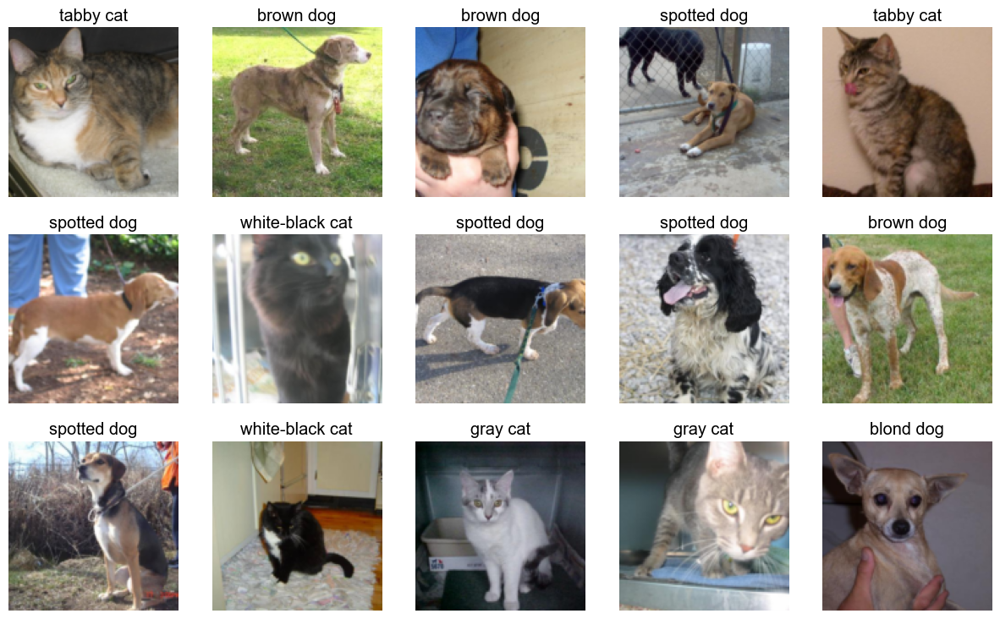

In [22]:
data_classes_dir = os.path.join(dst_folder, "classes")
show_random_images_with_parent_label_and_basic_info(data_classes_dir, 15, 3)

Na powyższych danych widać, że jest jest mało "grEy" dog, oraz spotted cat. Mam jeszcze plany na pracę nad tym datasetem (dodatkową selekcję), ale najpierw postaram się dopełnić te 2 zbiory. Z pomocą taggy, komendy "search".

Zamiast "grey dog" wyszukam "gray dog" oraz zamiast "spotted cat" wyszukam synonimem "mottled cat". Wiąże się to z ponownym załadowaniem wszystkich obrazów do pamięci RAM.

Ustawiam tu, aby przeanalizował wszystkie zdjęcia i 3000 zdjęć najbardziej pasujących do podanych fraz skopiował do wskazanego katalogu. Najprawdopodobniej wygeneruje to wiele duplikatów względem poprzedniego tagowania, więc dałem dla nich osobną ścieżkę.

In [37]:
input_dir = os.path.join(dst_folder, "Dog")
output_dir = os.path.join(dst_folder, "classes", "gray dog")
search_images_cmd(["-i", input_dir, "-o", output_dir, "-op", "copy", "-k", 3000, "--query", "gray dog"])

print("\n"+200*"-X--X-"+"\n")

input_dir = os.path.join(dst_folder, "Cat")
output_dir = os.path.join(dst_folder, "classes", "mottled cat")
search_images_cmd(["-i", input_dir, "-o", output_dir, "-op", "copy", "-k", 3000, "-q", "mottled cat"])


Searching images in D:/code/animal-color-classification/data\Dog for query='gray dog'...


2025-03-15 22:02:40,602 - CRITICAL - CUDA available, device: NVIDIA GeForce GTX 1060 3GB
2025-03-15 22:02:44,228 - INFO - CLIP model loaded successfully.


Loading images


2025-03-15 22:03:01,013 - ERROR - Cannot open image D:/code/animal-color-classification/data\Dog\11702.jpg: cannot identify image file 'D:\\code\\animal-color-classification\\data\\Dog\\11702.jpg'
C:\Users\oleko\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\TiffImagePlugin.py:890: UserWarning: Truncated File Read
  warnings.warn(str(msg))
2025-03-15 22:05:27,818 - INFO - Searching for 'gray dog' in 17500 images ...


OutOfMemoryError: CUDA out of memory. Tried to allocate 5.01 GiB. GPU 0 has a total capacity of 3.00 GiB of which 0 bytes is free. Of the allocated memory 30.08 GiB is allocated by PyTorch, and 3.77 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

Tak jak widać powyżej na tracebacku "OutOfMemoryError: CUDA out of memory. Tried to allocate 5.01 GiB. GPU 0 has a total capacity of 3.00 GiB of which 0 bytes is free. Of the allocated memory 30.08 GiB is allocated by PyTorch, and 3.77 GiB is reserved by PyTorch but unallocated." skończyła mi się karta graficzna i nie jest w stanie załadować do swojej pamięci VRAM jednocześnie 17500 grafik. Najprawdopodobniej pominę te 2 klasy, bo planuję jeszcze dodac klasę w stylu "pozostałe".

#### Kolejny krok - weryfikacja występowania duplikatów

Aby model był efektywny, chcę unikać występowania duplikatów tych samych zdjęć w datasecie. Do tego również wykorzystam moje narzędzie Taggy - komenda "duplicates".

In [43]:
classes_to_find_duplicates = os.listdir(data_classes_dir)
print(classes_to_find_duplicates)

['black dog', 'blond dog', 'brown dog', 'ginger cat', 'gray cat', 'grey dog', 'spotted cat', 'spotted dog', 'tabby cat', 'white dog', 'white-black cat']


In [44]:
parameters = []
for class_name in classes_to_find_duplicates:
    parameters.append("-l")
    parameters.append(class_name)

print(parameters)

['-l', 'black dog', '-l', 'blond dog', '-l', 'brown dog', '-l', 'ginger cat', '-l', 'gray cat', '-l', 'grey dog', '-l', 'spotted cat', '-l', 'spotted dog', '-l', 'tabby cat', '-l', 'white dog', '-l', 'white-black cat']


Komenda duplikaty również dodatkowo grupuje duplikaty wedle labelek, więc w celu ponownej weryfikacji dodam je do parametrów wywoławczych.

Detekcja duplikatów tak jak wcześniej pisałem, działa podobnie do search, że na początku ładuje wszystkie pliki w katalogu do pamięci. Nie patrząc na zasoby, najopyymalniej by było zrobić to na samym początku, przed definicją klas. Ale tak jak widać przy poprzedniej próbie załadowania 17500 plików do pamięci VRAM moja karta graficzna nie daje rady. W przypadku gdy są one pogrupowane w mniejsze zbiory, nie powinno być już problemu.

Dla każdej klasy wywołuje taggy osobno. Tworzę nowe foldery i pliki kopiję, abym w razie jakiegoś błędu nie musiał ponownie wywoływać tych wszystkich czasochłonnych procesów. Wszelkie grafiki, które mają co najmniej jedno procentowe podobieństwo cosinusowe zostaną uznane za duplikaty i pogrupowane w folderach razem z podobnymi obrazami. Dla unikalnych grafik również powstanie dedykowany folder.

Zaznaczam również --propose-best aby zaproponowało po jednej grafice, która jest ewentualnie najlepszej jakości. Mam zaimplementowane 2 metody jedna laplacian - bazowa określająca jakość po ostrości całego zdjęcia, advanced wykorzystuje również bibliotekę face_recognitions do rozpoznawania twarzy i toleruje np. rozmazywanie tła w zdjęciach portretowych -> laplacian zdjęcie z rozmytym tłem uznaje za zdjęcie złej jakości. Nie jestem pewien jakby zadziałało rozpoznawanie twarzy u psów, ale w Jupyterze coś nie jestem w stanie doinstalować tej biblioteki.

[update] jakieś problemy z ["--propose-best", "--best-method", "laplacian"] przez Jupyter zaczęły się pojawiać, więc wyłączyłem tą opcję.


In [56]:
for i, class_name in enumerate(classes_to_find_duplicates):
    logger.info(f"\nProcesuję {i+1}/{len(classes_to_find_duplicates)}.....\n")
    input_dir = os.path.join(data_classes_dir, class_name)
    output_dir = os.path.join(dst_folder, "classes_after_duplicates_detecting", class_name)
    cmd = ["-i", input_dir, "-o", output_dir, "-op", "copy", "-t", 0.99] + parameters
    try:
        find_duplicates_cmd(cmd)
    except Exception as e:
        logger.error(e)

2025-03-16 01:20:56,906 - INFO - 
Procesuję 1/11.....



Operation: copy, Labels: ('black dog', 'blond dog', 'brown dog', 'ginger cat', 'gray cat', 'grey dog', 'spotted cat', 'spotted dog', 'tabby cat', 'white dog', 'white-black cat')
Finding duplicates in D:/code/animal-color-classification/data\classes\black dog with threshold=0.99 ...


2025-03-16 01:20:56,913 - CRITICAL - CUDA available, device: NVIDIA GeForce GTX 1060 3GB
2025-03-16 01:20:59,327 - INFO - CLIP model loaded successfully.
2025-03-16 01:20:59,328 - INFO - Checking duplicates (sync) ...


Loading images


2025-03-16 01:21:11,539 - INFO - Loaded 2759 images for duplicate checking.
2025-03-16 01:24:02,936 - INFO - Image features extracted.
2025-03-16 01:24:02,937 - INFO - Similarity matrix computed.
2025-03-16 01:24:02,938 - INFO - Comparing 3804661 pairs of images ...
2025-03-16 01:24:02,938 - INFO - Starting comparison ...


Comparing pairs


2025-03-16 01:28:18,656 - INFO - Found 300 duplicate groups.


Grouping duplicates


2025-03-16 01:28:19,273 - INFO - Group 1 (2 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\black dog_1
2025-03-16 01:28:19,750 - INFO - Group 2 (2 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\brown dog_2
2025-03-16 01:28:20,458 - INFO - Group 3 (3 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\white-black cat_3
2025-03-16 01:28:20,933 - INFO - Group 4 (2 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\black dog_4
2025-03-16 01:28:21,404 - INFO - Group 5 (2 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\black dog_5
2025-03-16 01:28:21,881 - INFO - Group 6 (2 images) => D:/code/animal-color-classification/data\classes_after_duplicates_detecting\black dog\black dog_6
2025-03-16 01:28:22,354 - INFO - Group 7 (2 images) => D:/code/animal-color-

AttributeError: 'tuple' object has no attribute 'tb_frame'

# Zadanie minimum
Już testowałem z poziomu CLI jakie klasy najłatwiej jest wyciągnąc z Dataset'u z microsoft w nazwie.


Wykorzystamy przykład z [fastbook](https://github.com/fastai/fastbook/blob/master/02_production.ipynb):

In [21]:
#hide


In [28]:
path = Path('../bear_classification/misie/1')

In [29]:
loko = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [30]:
#hide
dls = loko.dataloaders(path)

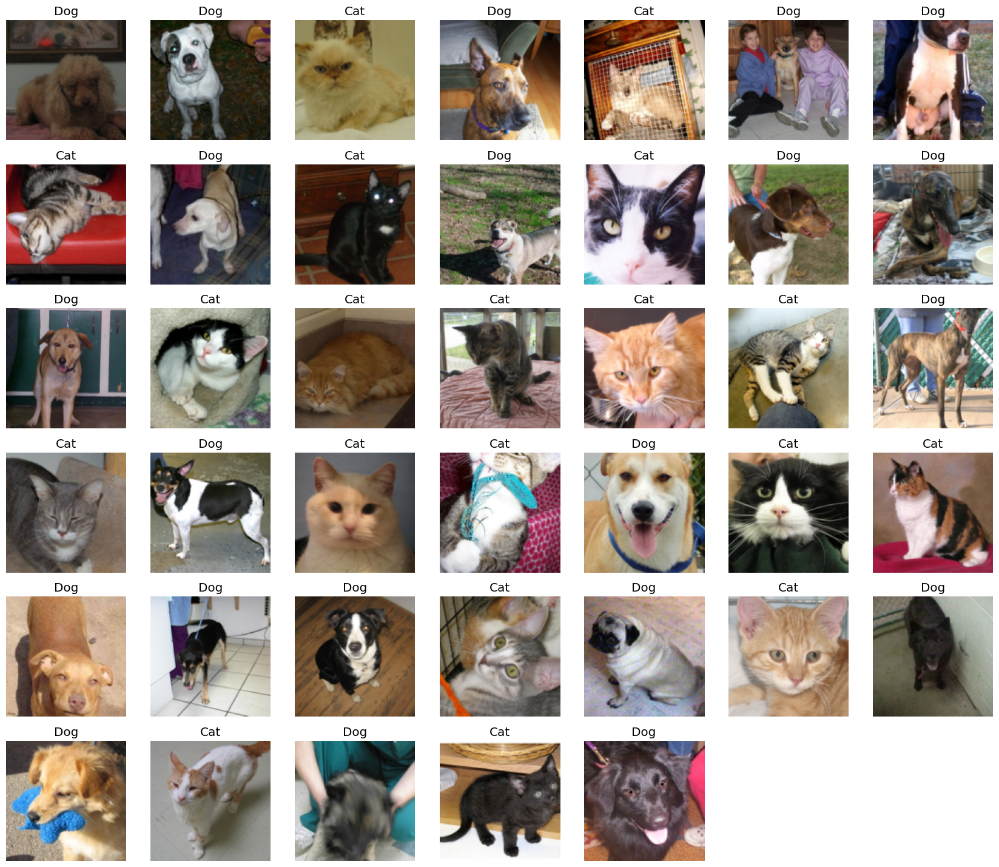

In [33]:
dls.valid.show_batch(max_n=40, nrows=6)


### Przygotowanie danych

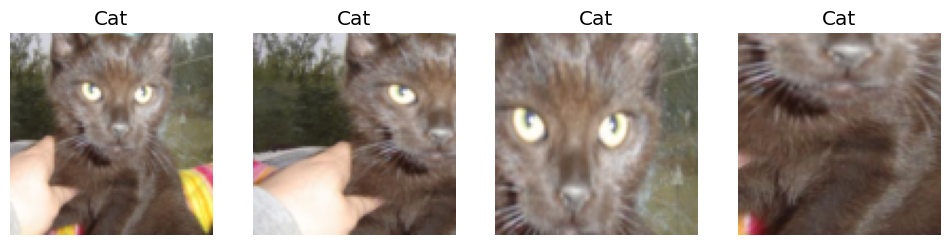

In [34]:
loko = loko.new(item_tfms=RandomResizedCrop(96, min_scale=0.1))
dls = loko.dataloaders(path, bs=20)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

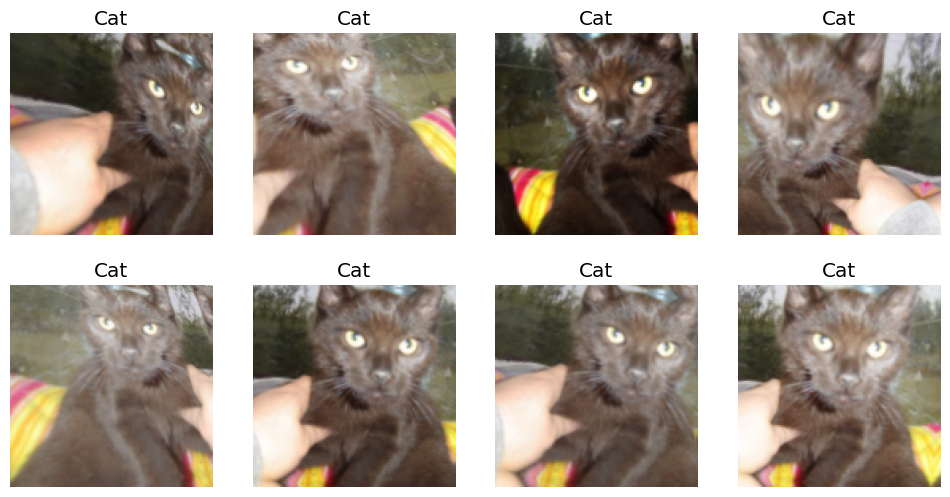

In [35]:
#hide
loko = loko.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=1.5))
dls = loko.dataloaders(path, bs=25)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

### Trenowanie

Wykorzystamy istniejący model [rosnet18](https://fastai1.fast.ai/vision.models.html).

In [37]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5) # można poeksperymentować

epoch,train_loss,valid_loss,error_rate,time


UnidentifiedImageError: cannot identify image file 'D:\\code\\PycharmProjects\\taggy\\bear_classification\\misie\\1\\PetImages\\Cat\\666.jpg'

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
interp.plot_top_losses(6, nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
learn.export() # Eksport przetrenowanego modelu (może się przydać przy użytku w innym projekcie)

In [ ]:
path = Path()
learn_inf = load_learner(path/'export.pkl') # import zapisanego wyżej modelu (tak dla zasady)

In [22]:
out_pl = widgets.Output()
out_pl.clear_output()
btn_upload = SimpleNamespace(data = ['loko/steam/images-10.jpeg'])
img = PILImage.create(btn_upload.data[-1])
with out_pl: display(img.to_thumb(256,256))
btn_run = widgets.Button(description='Classify')
lbl_pred = widgets.Label()
lbl_pred.value = ""

def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

def on_upload_change(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(256,256))

btn_run.on_click(on_click_classify)
btn_upload = widgets.FileUpload()
btn_upload.observe(on_upload_change, names='_counter')
VBox([widgets.Label("Let's find out how it works!"), btn_upload, btn_run, out_pl, lbl_pred])